In [1]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

import urllib.request
from PIL import Image

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR, LinearSVC



from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest
from sklearn import svm, datasets
from sklearn.model_selection import GridSearchCV

import tools_tb

import warnings

warnings.filterwarnings("ignore")

In [6]:
df = pd.read_csv("diamonds_train.csv", index_col = 0)

# Let's start with the ordinal ones, to see if they have any relation with price

# First we assign the corresponding ordinal values we want to replace the categorical ones with
cut_dict = {
    "Fair" : 1,
    "Good" : 2,
    "Very Good" : 3,
    "Premium" : 4,
    "Ideal" : 5
}

clarity_dict = {
    "I1" : 1,
    "SI2" : 2,
    "SI1" : 3,
    "VS2" : 4,
    "VS1" : 5,
    "VVS2" : 6,
    "VVS1" : 7,
    "IF" : 8
}

# Create the columns in the df for them
df["cut_encoded"] = df.cut.map(cut_dict)
df["clarity_encoded"] = df.clarity.map(clarity_dict)

# Now, let's do the same for the nominal variable "color"
df = pd.get_dummies(df, prefix = ["color"], columns = ["color"])

# Delete the old categorical independent variables
df = df.drop(["cut", "clarity"], axis = 1)

X = df.drop("price", axis = 1)
X = StandardScaler().fit_transform(X)
y = df["price"]

In [10]:
##########
split = 0.25
seed = 42

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = split, random_state = seed)

rf = RandomForestRegressor(n_estimators = 500, criterion = "mse", random_state = seed, n_jobs = -1)

rf.fit(X_train, y_train)

y_pred_train = rf.predict(X_train)
y_pred_test = rf.predict(X_test)

# Scores
score_train = rf.score(X_train, y_train)
score_test = rf.score(X_test, y_test)

# RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))

print(f"Train data\nScore = {score_train}\nRMSE = {rmse_train}")
print("#" * 50)
print(f"Test data\nScore = {score_test}\nRMSE = {rmse_test}")

Train data
Score = 0.9973216587288067
RMSE = 206.15142959833122
##################################################
Test data
Score = 0.9801161807476293
RMSE = 560.8784163206553


In [82]:
features_list = df.drop("price", axis = 1).columns
features_importance = list(rf.feature_importances_)

features_importances = [(feature, importance) for feature, importance in zip(features_list, features_importance)]

features_importances

[('carat', 0.4295175981255128),
 ('depth', 0.00307761653422926),
 ('table', 0.0019436461701376295),
 ('x', 0.09763067904845406),
 ('y', 0.3265492866437968),
 ('z', 0.04407032932931446),
 ('cut_encoded', 0.0017178385218815598),
 ('clarity_encoded', 0.06359126219168644),
 ('color_D', 0.0030543140393170572),
 ('color_E', 0.001956027773118475),
 ('color_F', 0.0019263906645450597),
 ('color_G', 0.002628056175797523),
 ('color_H', 0.0049444015599620205),
 ('color_I', 0.007157834780017249),
 ('color_J', 0.010234718442229562)]

In [83]:
features_list

Index(['carat', 'depth', 'table', 'x', 'y', 'z', 'cut_encoded',
       'clarity_encoded', 'color_D', 'color_E', 'color_F', 'color_G',
       'color_H', 'color_I', 'color_J'],
      dtype='object')

# MODEL 2

In [17]:
df = pd.read_csv("diamonds_train.csv", index_col = 0)

# Let's start with the ordinal ones, to see if they have any relation with price

# First we assign the corresponding ordinal values we want to replace the categorical ones with
cut_dict = {
    "Fair" : 1,
    "Good" : 2,
    "Very Good" : 3,
    "Premium" : 4,
    "Ideal" : 5
}

clarity_dict = {
    "I1" : 1,
    "SI2" : 2,
    "SI1" : 3,
    "VS2" : 4,
    "VS1" : 5,
    "VVS2" : 6,
    "VVS1" : 7,
    "IF" : 8
}

# Create the columns in the df for them
df["cut_encoded"] = df.cut.map(cut_dict)
df["clarity_encoded"] = df.clarity.map(clarity_dict)

# Now, let's do the same for the nominal variable "color"
df = pd.get_dummies(df, prefix = ["color"], columns = ["color"])

# Delete the old categorical independent variables
df = df.drop(["cut", "clarity"], axis = 1)

X = df.drop("price", axis = 1)
y = df["price"]

split = 0.25
seed = 42

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = split, random_state = seed)

In [37]:
##########
split = 0.25
seed = 42

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = split, random_state = seed)

rf = RandomForestRegressor(n_estimators = 500, criterion = "mse", random_state = seed, n_jobs = -1, max_depth = 15, max_features = 9)

rf.fit(X_train, y_train)

y_pred_train = rf.predict(X_train)
y_pred_test = rf.predict(X_test)

# Scores
score_train = rf.score(X_train, y_train)
score_test = rf.score(X_test, y_test)

# RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))

print(f"Train data\nScore = {score_train}\nRMSE = {rmse_train}")
print("#" * 50)
print(f"Test data\nScore = {score_test}\nRMSE = {rmse_test}")

Train data
Score = 0.9940039978339229
RMSE = 308.4496520205704
##################################################
Test data
Score = 0.9809562306904028
RMSE = 548.9025905885951


# MODEL 3

In [54]:
df2 = pd.read_csv("diamonds_train.csv", index_col = 0)
df2.head()

,carat,cut,color,clarity,depth,table,x,y,z,price
0,1.21,Ideal,H,VS2,63.0,57.0,6.73,6.70,4.23,6134
1,0.28,Very Good,D,VVS2,64.0,56.0,4.14,4.17,2.66,532
2,0.42,Premium,F,VS1,61.2,58.0,4.86,4.82,2.96,1103
3,0.26,Ideal,H,IF,61.1,57.0,4.16,4.12,2.53,600
4,1.10,Good,G,SI1,63.4,57.0,6.52,6.55,4.14,4997


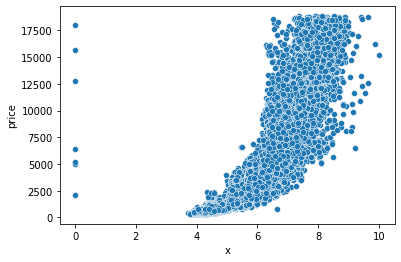

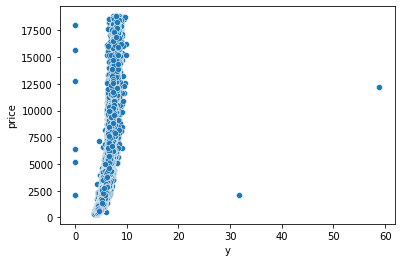

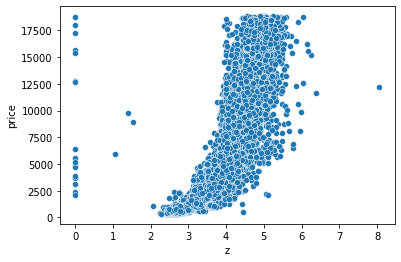

In [49]:
for column in ["x", "y", "z"]:
    sns.scatterplot(data = df2, x = column, y = "price")
    plt.show()

In [50]:
df2[df2["y"] > 10]

,carat,cut,color,clarity,depth,table,x,y,z,price
33575,0.51,Ideal,E,VS1,61.8,55.0,5.15,31.8,5.12,2075
34424,2.00,Premium,H,SI2,58.9,57.0,8.09,58.9,8.06,12210


In [51]:
df2[(df2["z"] < 2) | (df2["z"] > 7)]

,carat,cut,color,clarity,depth,table,x,y,z,price
4960,2.80,Good,G,SI2,63.8,58.0,8.90,8.85,0.00,18788
5127,2.20,Premium,H,SI1,61.2,59.0,8.42,8.37,0.00,17265
5298,1.53,Ideal,I,SI1,61.9,54.0,7.43,7.50,1.53,8971
6571,1.56,Ideal,G,VS2,62.2,54.0,0.00,0.00,0.00,12800
10971,1.12,Premium,G,I1,60.4,59.0,6.71,6.67,0.00,2383
12572,1.10,Premium,G,SI2,63.0,59.0,6.50,6.47,0.00,3696
15252,1.20,Premium,D,VVS1,62.1,59.0,0.00,0.00,0.00,15686
15518,1.15,Ideal,G,VS2,59.2,56.0,6.88,6.83,0.00,5564
18027,1.07,Ideal,F,SI2,61.6,56.0,0.00,6.62,0.00,4954
18658,1.01,Premium,F,SI2,59.2,58.0,6.50,6.47,0.00,3837


In [52]:
df2[df2["x"] == 0]

,carat,cut,color,clarity,depth,table,x,y,z,price
6571,1.56,Ideal,G,VS2,62.2,54.0,0.0,0.00,0.0,12800
15252,1.20,Premium,D,VVS1,62.1,59.0,0.0,0.00,0.0,15686
18027,1.07,Ideal,F,SI2,61.6,56.0,0.0,6.62,0.0,4954
23417,0.71,Good,F,SI2,64.1,60.0,0.0,0.00,0.0,2130
24641,1.14,Fair,G,VS1,57.5,67.0,0.0,0.00,0.0,6381
25671,2.25,Premium,H,SI2,62.8,59.0,0.0,0.00,0.0,18034
40203,1.00,Very Good,H,VS2,63.3,53.0,0.0,0.00,0.0,5139


In [56]:
df2 = df2[df2["x"] != 0]
df2 = df2[df2["y"] < 10]
df2 = df2[(df2["z"] > 2) | (df2["z"] < 7)]
df2.shape

(40336, 10)

In [80]:
df2 = pd.read_csv("diamonds_train.csv", index_col = 0)

df2 = df2[df2["x"] != 0]
df2 = df2[df2["y"] < 10]
df2 = df2[(df2["z"] > 2) | (df2["z"] < 7)]

# Let's start with the ordinal ones, to see if they have any relation with price

# First we assign the corresponding ordinal values we want to replace the categorical ones with
cut_dict = {
    "Fair" : 1,
    "Good" : 2,
    "Very Good" : 3,
    "Premium" : 4,
    "Ideal" : 5
}

clarity_dict = {
    "I1" : 1,
    "SI2" : 2,
    "SI1" : 3,
    "VS2" : 4,
    "VS1" : 5,
    "VVS2" : 6,
    "VVS1" : 7,
    "IF" : 8
}

# Create the columns in the df for them
df2["cut_encoded"] = df2.cut.map(cut_dict)
df2["clarity_encoded"] = df2.clarity.map(clarity_dict)

# Now, let's do the same for the nominal variable "color"
df2 = pd.get_dummies(df2, prefix = ["color"], columns = ["color"])

# Delete the old categorical independent variables
df2 = df2.drop(["cut", "clarity"], axis = 1)

X = df2.drop("price", axis = 1)
y = df2["price"]

split = 0.1
seed = 42

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = split, random_state = seed)

In [89]:
rf2 = RandomForestRegressor(n_estimators = 1000, criterion = "mse", random_state = seed, n_jobs = -1, max_depth = 15, max_features = 9)

rf2.fit(X_train, y_train)

y_pred_train = rf2.predict(X_train)
y_pred_test = rf2.predict(X_test)

# Scores
score_train = rf2.score(X_train, y_train)
score_test = rf2.score(X_test, y_test)

# RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))

print(f"Train data\nScore = {score_train}\nRMSE = {rmse_train}")
print("#" * 50)
print(f"Test data\nScore = {score_test}\nRMSE = {rmse_test}")

Train data
Score = 0.9935205578945117
RMSE = 319.25734811114796
##################################################
Test data
Score = 0.98269269956536
RMSE = 540.6427122456366


# Guardar datos de este último modelo

In [90]:
X_pred = pd.read_csv("diamonds_test.csv", index_col = 0)
X_pred.head()

,carat,cut,color,clarity,depth,table,x,y,z
0,0.30,Ideal,H,SI2,60.0,56.0,4.41,4.43,2.65
1,0.34,Ideal,D,IF,62.1,57.0,4.52,4.46,2.79
2,1.57,Very Good,I,VS2,60.3,58.0,7.58,7.55,4.56
3,0.31,Ideal,H,VS2,61.8,57.0,4.32,4.36,2.68
4,1.51,Good,I,VVS1,64.0,60.0,7.26,7.21,4.63


In [91]:
X_pred["cut_encoded"] = X_pred.cut.map(cut_dict)
X_pred["clarity_encoded"] = X_pred.clarity.map(clarity_dict)

# Now, let's do the same for the nominal variable "color"
X_pred = pd.get_dummies(X_pred, prefix = ["color"], columns = ["color"])

# Delete the old categorical independent variables
X_pred = X_pred.drop(["cut", "clarity"], axis = 1)

X_pred.head()

,carat,depth,table,x,y,z,cut_encoded,clarity_encoded,color_D,color_E,color_F,color_G,color_H,color_I,color_J
0,0.30,60.0,56.0,4.41,4.43,2.65,5,2,0,0,0,0,1,0,0
1,0.34,62.1,57.0,4.52,4.46,2.79,5,8,1,0,0,0,0,0,0
2,1.57,60.3,58.0,7.58,7.55,4.56,3,4,0,0,0,0,0,1,0
3,0.31,61.8,57.0,4.32,4.36,2.68,5,4,0,0,0,0,1,0,0
4,1.51,64.0,60.0,7.26,7.21,4.63,2,7,0,0,0,0,0,1,0


In [92]:
predictions_submit = rf2.predict(X_pred)
predictions_submit

array([  459.12024329,  1416.80843928,  9439.85390081, ...,
       14807.29449329, 10047.33216599,   730.53699729])

In [93]:
submission = pd.DataFrame({"id": range(len(predictions_submit)), "price": predictions_submit})
submission.head()

,id,price
0,0,459.120243
1,1,1416.808439
2,2,9439.853901
3,3,536.313291
4,4,8684.337924


In [94]:
tools_tb.chequeator(submission)

You're ready to submit!
